In [33]:
#import libraries

import pandas as pd
import numpy as np



import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression

from sklearn import metrics

from sklearn.metrics import confusion_matrix
import itertools

from sklearn.model_selection import GridSearchCV

from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import GradientBoostingClassifier

import xgboost as xgb

import seaborn as sns
sns.set(context='paper', style='darkgrid', rc={'figure.facecolor':'white'}, font_scale=1.2)

import pickle

In [34]:
X = pd.read_csv('CSV_files/training_set_values.csv', index_col = 0)
y = pd.read_csv('CSV_files/training_set_labels.csv', index_col = 0)

df = pd.concat([X, y], axis = 1)

Text(0.5, 1.0, '# of Wells per Status Group')

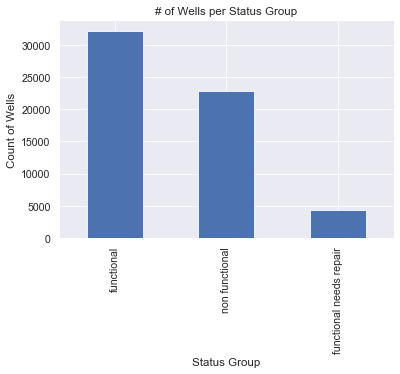

In [40]:
df['status_group'].value_counts().plot.bar()
plt.xlabel('Status Group')
plt.ylabel('Count of Wells')
plt.title('# of Wells per Status Group')


For this project we are looking at data on water wells in Tanzania. We want to see what factors of the well (location, altitude, quantity and quality of water, etc) lead to lack of functionality of wells. This information could then be used by the companies that handle the functionality of the well (whether it be the government or the other companies) to decide what wells that are functional now may be showing signs of wear and will need to be replaced soon. 

The approach we took on this was to first look at this problem as a logical one and use preset ideas we had about wells and what could lead to damage to make a base model. From there we used different methods of Data analysis to get a better idea of what exactly we want to look at. 

## EDA analysis

Using the eda we wanted to answer 3 big questions. 

 - Which of our preset ideas about wells would be wrong?

 - What factors that we overlooked would have a big impact on the actual status of the wells?

 - Could we use this EDA to apply to a real life scenarios and come up with reasons why something is causing well damage and possibly come up with some sort of feasible solution?

### Basic EDA 

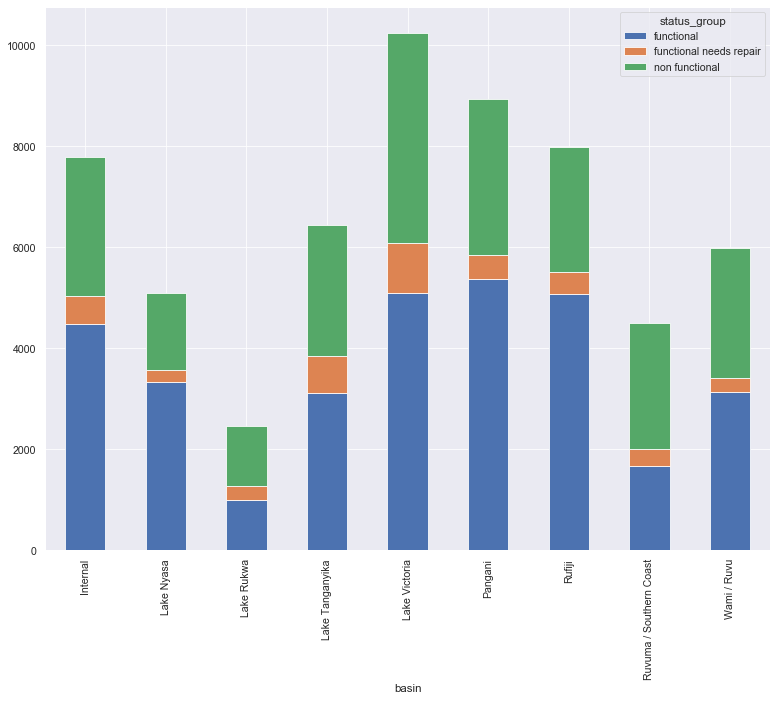

In [3]:
#Basin by status group

df.groupby('basin')['status_group'].value_counts().unstack().plot(kind='bar', stacked=True, figsize=(13,10))
plt.show()

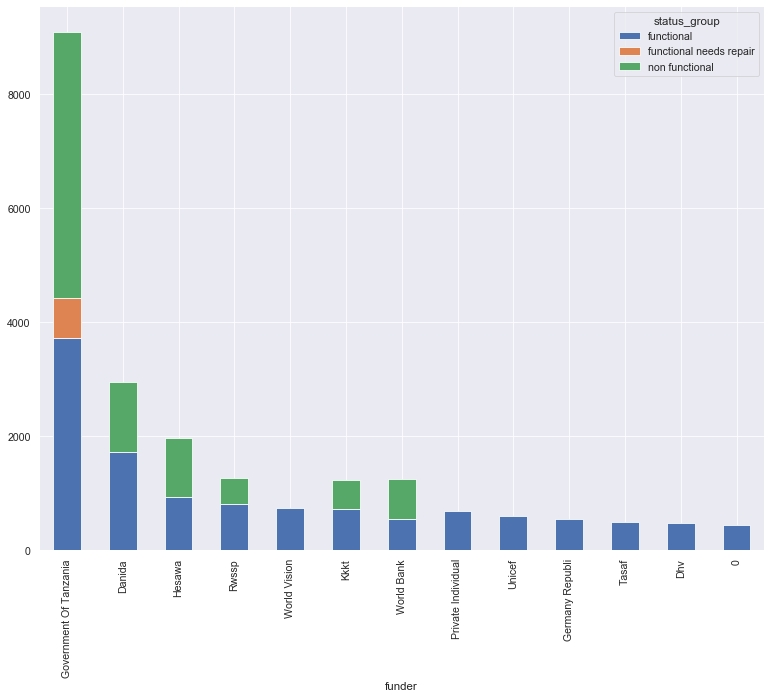

In [4]:
#Top funders separated by status_group
#Government Of Tanzania, Danida, Hesawa are the top 3 we kept

df.groupby('funder')['status_group'].value_counts().sort_values(ascending = False).head(20).unstack().plot(kind = 'bar', stacked = True, figsize=(13,10))

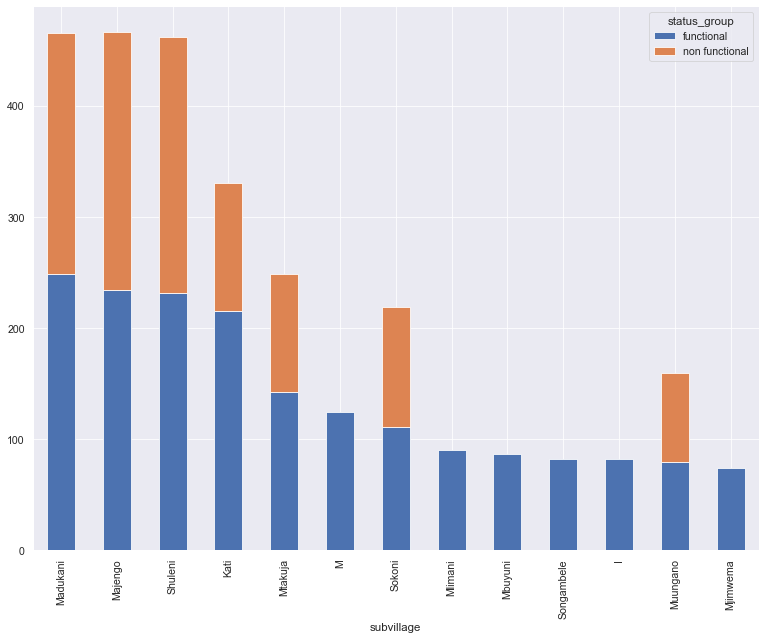

In [5]:
#top subvillage by status group, we kept the top 3: Madukani, Majengo, and Shuleni

df.groupby('subvillage')['status_group'].value_counts().sort_values(ascending = False).head(20).unstack().plot(kind = 'bar', stacked = True, figsize=(13,10))

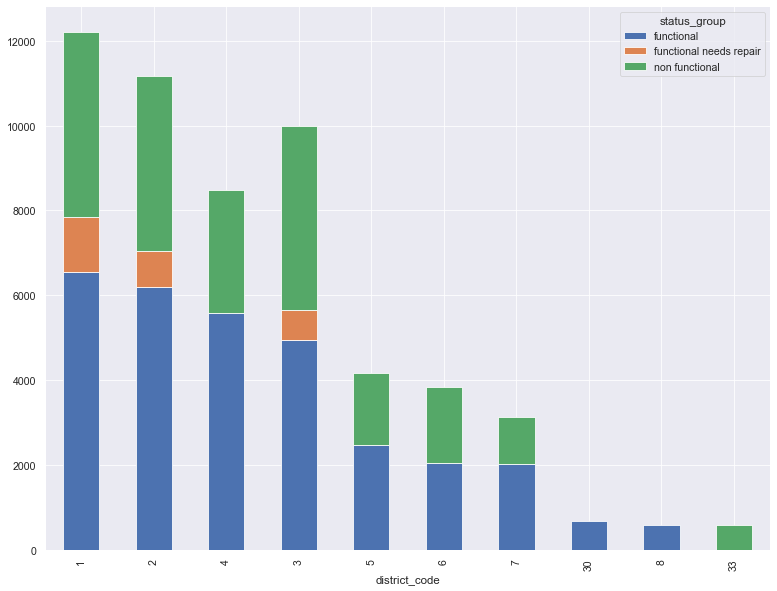

In [6]:
#District Code by status group and only keeping 1,2,3,4

df.groupby('district_code')['status_group'].value_counts().sort_values(ascending = False).head(20).unstack().plot(kind = 'bar', stacked = True, figsize=(13,10))

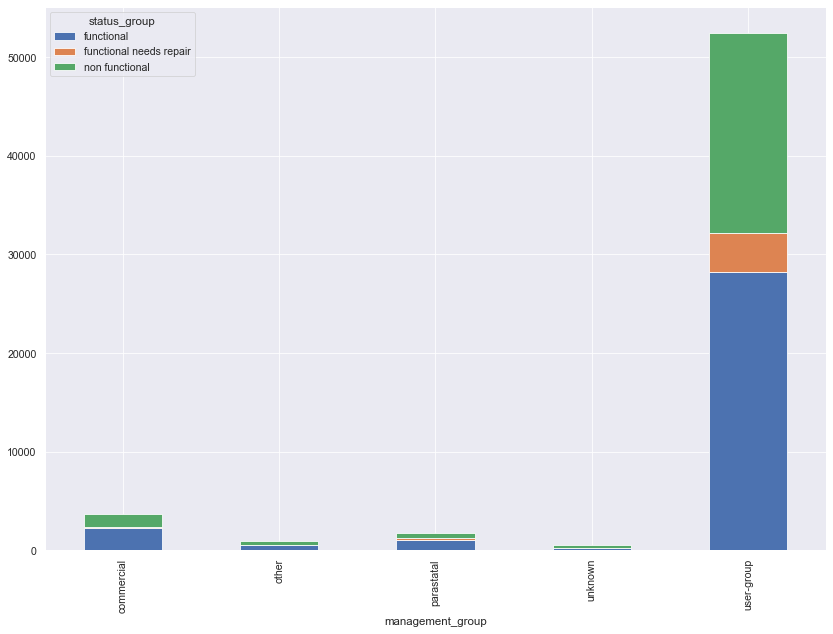

In [7]:
#grouped by management group keeping only user-group

df.groupby('management_group')['status_group'].value_counts().sort_values(ascending = False).head(50).unstack().plot(kind = 'bar', stacked = True, figsize=(14,10))

status_group
functional                 AxesSubplot(0.125,0.125;0.775x0.755)
functional needs repair    AxesSubplot(0.125,0.125;0.775x0.755)
non functional             AxesSubplot(0.125,0.125;0.775x0.755)
Name: construction_year, dtype: object

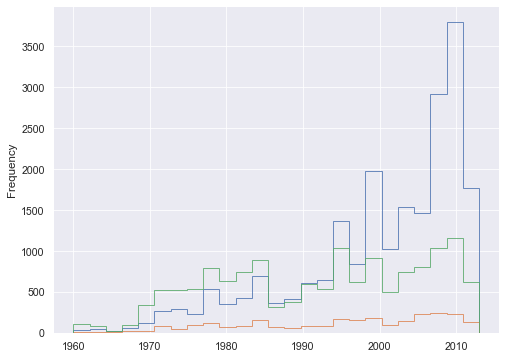

In [8]:
#separated by 1990 for the cut off for nonfunctional vs functional


df[df['construction_year'] > 1 ].groupby('status_group')['construction_year'].plot(kind='hist', histtype='step', bins= 25, figsize=(8,6))

# EDA Using Folium

In [9]:
import folium
import branca
from folium import plugins
from scipy.interpolate import griddata
import geojsoncontour
import scipy as sp
import scipy.ndimage

In [10]:
df_plot = df[df['longitude'] != 0]
df_plot.reset_index(inplace = True)

In [11]:
lat = [x for x in df_plot['latitude'] if x != -2e-08]
long = [x for x in df_plot['longitude'] if x != 0]

lat_long_total = [(lat[i], long[i]) for i in range(len(lat))]

In [12]:
df_f = df_plot[df_plot['status_group'] == 'functional']
df_nf = df_plot[df_plot['status_group'] == 'non functional']
df_fnr = df_plot[df_plot['status_group'] == 'functional needs repair']

In [13]:
lat_f = [x for x in df_f['latitude'] if x != -2e-08]
long_f = [x for x in df_f['longitude'] if x != 0]

lat_nf = [x for x in df_nf['latitude'] if x != -2e-08]
long_nf = [x for x in df_nf['longitude'] if x != 0]

lat_fnr = [x for x in df_fnr['latitude'] if x != -2e-08]
long_fnr = [x for x in df_fnr['longitude'] if x != 0]

lat_long_f = [(lat_f[i], long_f[i]) for i in range(len(lat_f))]
lat_long_nf = [(lat_nf[i], long_nf[i]) for i in range(len(lat_nf))]
lat_long_fnr = [(lat_fnr[i], long_fnr[i]) for i in range(len(lat_fnr))]

In [14]:
mapit = folium.Map(location=[np.mean(lat), np.mean(long)], zoom_start=6)
plugins.Fullscreen(position='topright', force_separate_button=True).add_to(mapit)
for coord in lat_long_nf[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.7, color='red', radius=1).add_to(mapit)
for coord in lat_long_f[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.7, color='blue', radius=1).add_to(mapit)
for coord in lat_long_fnr[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.7, color='green', radius=1).add_to( mapit ) 

    
mapit

## Plotting Altitude map using folium

/Users/antoniohila/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/Users/antoniohila/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


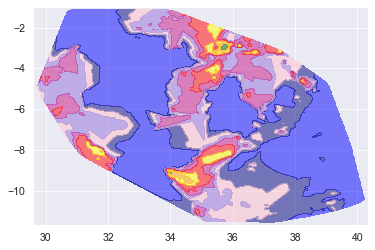

In [15]:
# Set all negative elevations to zero to show that they will be under the mean sea level of zero

for i in range(0,len(df_plot)):
    if df_plot['gps_height'][i] <= 0.:
        df_plot['gps_height'][i] = 0.
        
# Setup minimum and maximum values for the contour lines
vmin = df_plot['gps_height'].min() 
vmax = df_plot['gps_height'].max()

# Setup colormap
colors = ['blue', 'navy', 'pink', 'mediumpurple', 'mediumvioletred',
         'red','yellow','orange', 'darkgreen']
levels = len(colors)
cm     = branca.colormap.LinearColormap(colors, vmin=vmin, vmax=vmax).to_step(levels)

# Convertion from dataframe to array
x = np.asarray(df_plot.longitude.tolist())
y = np.asarray(df_plot.latitude.tolist())
z = np.asarray(df_plot.gps_height.tolist()) 
# Make a grid
x_arr          = np.linspace(np.min(x), np.max(x), 500)
y_arr          = np.linspace(np.min(y), np.max(y), 500)
x_mesh, y_mesh = np.meshgrid(x_arr, y_arr)
 
# Grid the elevation (Edited on March 30th, 2020)
z_mesh = griddata((x, y), z, (x_mesh, y_mesh), method='linear')
 
# Use Gaussian filter to smoothen the contour
sigma = [1,1]
z_mesh = sp.ndimage.filters.gaussian_filter(z_mesh, sigma, mode='constant')
 
# Create the contour
contourf = plt.contourf(x_mesh, y_mesh, z_mesh, levels, alpha=0.5, colors=colors, linestyles='None', vmin=vmin, vmax=vmax)

In [16]:
# Convert matplotlib contourf to geojson
geojson = geojsoncontour.contourf_to_geojson(
    contourf=contourf,
    min_angle_deg=3.0,
    ndigits=5,
    stroke_width=1,
    fill_opacity=0.1)
 
# Set up the map placeholdder
geomap1 = folium.Map([df_plot.latitude.mean(), df_plot.longitude.mean()], zoom_start=6, tiles="OpenStreetMap")
# Plot the contour on Folium map
folium.GeoJson(
    geojson,
    style_function=lambda x: {
        'color':     x['properties']['stroke'],
        'weight':    x['properties']['stroke-width'],
        'fillColor': x['properties']['fill'],
        'opacity':   0.5,
    }).add_to(geomap1)
 
# Add the colormap to the folium map for legend
cm.caption = 'Elevation'
geomap1.add_child(cm)
 
# Add the legend to the map
plugins.Fullscreen(position='topright', force_separate_button=True).add_to(geomap1)


for coord in lat_long_nf[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='red', radius=1).add_to(geomap1)
for coord in lat_long_f[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='blue', radius=1).add_to(geomap1)
for coord in lat_long_fnr[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='green', radius=1).add_to(geomap1)

    
geomap1



## Applying Best Model

In [17]:
from pipeline_functions import pipeline_df

In [18]:
df = pipeline_df(df)

In [19]:
X_new = df.drop('status_group', axis = 1)
y_new = df['status_group']

In [20]:
#split for training

X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, random_state = 20, test_size = .25) 

In [21]:
with open('Pickle_files/xgb_model_with_nan', 'rb') as handle:
    xgb_df = pickle.load(handle)

In [22]:
y_pred_xgb = xgb_df.predict(X_test)

print('Test Accuracy score:', accuracy_score(y_test, y_pred_xgb))

Test Accuracy score: 0.7929292929292929


In [32]:
f1_score(y_test, y_pred_xgb, average='weighted')

0.7833631212369333

In [25]:
#confusiong mtrx 

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion Matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [26]:
classes = ['functional', 'functional needs repair', 'non functional']

Confusion Matrix, without normalization
[[7317  159  741]
 [ 593  262  153]
 [1370   59 4196]]


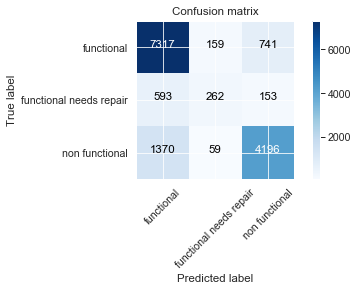

In [29]:
plot_confusion_matrix(metrics.confusion_matrix(y_test, y_pred_xgb), classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues)

## Applying Prediction to Validation Set

In [23]:
test_df = pd.read_csv('CSV_files/Test_set_values.csv', index_col=0)

test_df = pipeline_df(test_df)

In [24]:
test_results3 = xgb_df.predict(test_df)
testing_results3 = pd.DataFrame(test_results3, columns = ['status_group'])
test_labels3 = pd.concat([id_df, testing_results3], axis = 1)
test_labels3 = test_labels3.set_index('id')
test_labels3.to_csv('testing_results_ver3.csv')

NameError: name 'xgb4_df' is not defined

## Final Thoughts

We found that the most important factors were actually how the water is taken out of the well (if it was not done by a common means like gravity it was very likely to break quickly) and the location of the well. The second one was a little more surprising but had much more to do with the actual geography of tanzania because places like lindi and mtwara had a ton of non functional wells but it was at a low altitude and by the water, and plenty of other low altitude places near the water had proportionally more wells than not. But digging deeper we found that access into this area is actually very difficult so supplying these wells with water to keep them properly filled is difficult. This was further shown in the EDA as the quantity of water in the well had a higher proportion of lacking/dry wells than sufficiently filled ones. 

Things like this were very important to dig deeper into. Using the EDA to visualize ideas then digging deeper into the data to expand on those ideas gave us a much better understanding of the results and the problem in general. Some preset ideas such as high altitude areas being harder to get to and leading to non functional wells was actually false and instead areas that geographically may not make sense had more non functional wells for reasons that needed more digging into.